# Miguel Angel Ruiz Ortiz
## Procesamiento de Lenguaje Natural
## Examen 1: Entre Alhóndigas, Besos y Momias; Crónica de un Examen Anunciado

In [1]:
from pathlib import Path
from typing import Callable
from collections import Counter

import pandas as pd
import numpy as np
from scipy.sparse import hstack
import seaborn as sns
import matplotlib.pyplot as plt

import nltk
from nltk.tokenize import TweetTokenizer
nltk.download("stopwords")
from nltk.corpus import stopwords

from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import LsiModel
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/miguelruiz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/Users/miguelruiz/Documents/Academic Stuff/NLP/Code/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
sns.set_style("dark") # para mejores gráficas

### Lectura de datos

In [3]:
data_file = Path("../data/trip-advisor-guanajuato/Opiniones Tripadvisor_nlp2023.xlsx")

Con Pandas podemos leer directamente todas las hojas del archivo de Excel (ver [documentación](https://pandas.pydata.org/docs/reference/api/pandas.read_excel.html)). El método ``read_excel`` con el parámetro ``sheet_name=None`` regresa un diccionario donde cada llave es el nombre de una hoja, y su valor es un dataframe con el contenido de esa hoja.

In [4]:
all_dfs = pd.read_excel(data_file, sheet_name=None) 

Se puede ver que los lugares turísticos tienen el número de reseñas al final de la string. Se lo vamos a quitar con el siguiente código, y guardaremos los lugares turísticos en una lista:

In [5]:
print(list(all_dfs.keys()))

places_pretty = {
    place: " ".join(place.split()[:-1]) for place in all_dfs
}

all_dfs = {
    places_pretty[place]: df for place, df in all_dfs.items()
}

all_places = list(all_dfs.keys())
all_places

['Basilica Colegiata 560', 'Mercado Hidalgo 600', 'Casa de Diego Rivera 698', 'Universidad de Guanajuato 900', 'Alhóndiga 930', 'Teatro Juárez 1,010', 'Jardín de la Unión 1,134', 'Callejón del Beso 1,360', 'Monumento Pípila 1,620', 'Museo de las Momias 1,650']


['Basilica Colegiata',
 'Mercado Hidalgo',
 'Casa de Diego Rivera',
 'Universidad de Guanajuato',
 'Alhóndiga',
 'Teatro Juárez',
 'Jardín de la Unión',
 'Callejón del Beso',
 'Monumento Pípila',
 'Museo de las Momias']

In [6]:
all_dfs["Mercado Hidalgo"].head(3)

,Género,Edad,Nacional ó Internacional,Calificación,Escala,Número de aportaciones,Título de la opinión,Opinión,País,Idioma,Dispositivo,Fecha
0,Femenino,33.0,Internacional,Excelente,5,52,"""Busy city market""","""The market under a large metal building is bu...",Estados Unidos,Inglés,Móvil,2018-04-20
1,Masculino,50.0,Internacional,Muy bueno,4,491,"""People Watching, Local Feel Among The Tourists""","""Nicely done market with lots of food stalls, ...",Estados Unidos,Inglés,Móvil,2018-04-15
2,Femenino,24.0,Internacional,Excelente,5,39,"""Recuerdos son más baratos""","""El primer piso de la segunda planta, comida s...",Corea del Sur,Coreano,Móvil,2018-04-10


### Preprocesamiento

En la siguiente celda podemos ver que las calificaciones (i.e., la columna "Calificación") no concuerdan con los score de la columna "Escala":

In [7]:
score_to_string = {
    1: "Pésimo",
    2: "Malo",
    3: "Regular",
    4: "Muy bueno",
    5: "Excelente"
}

for place in all_places:
    df_filtered = all_dfs[place][
        all_dfs[place].apply(
            lambda row: score_to_string[row["Escala"]] != row["Calificación"],
            axis=1,
        )
    ][["Escala", "Calificación"]]

    if len(df_filtered) == 0:
        continue

    print(place)
    print(df_filtered)
    print("-" * 50)

Basilica Colegiata
     Escala Calificación
280       5    Muy bueno
--------------------------------------------------
Casa de Diego Rivera
     Escala Calificación
189       4      Regular
--------------------------------------------------
Jardín de la Unión
     Escala Calificación
463       5    Muy bueno
993       2    Excelente
--------------------------------------------------


De tal manera que tomaremos como *ground truth* la columna "Escala" y reescribiremos la columna "Calificación" a partir de los score. 

In [8]:
for place in all_places:
    all_dfs[place]["Calificación"] = pd.Categorical(
        all_dfs[place]["Escala"].apply(lambda score: score_to_string[score]), ["Pésimo", "Malo", "Regular", "Muy bueno", "Excelente"]
    )

La variable "Género" tiene valores que no son consistentes. La siguiente celda lo arregla.

In [9]:
gender_values = set()
for place in all_places:
    gender_values.update(all_dfs[place]["Género"].unique())
print(gender_values)

for place in all_places:
    all_dfs[place]["Género"] = pd.Categorical(
        all_dfs[place]["Género"].apply(lambda data: data.strip().title()),
        ["Femenino", "Masculino"],
    )

{'masculino', ' Masculino', 'Masculino', 'Femenino'}


A la columna "Nacional ó Internacional" la pondremos de tipo categórica (útil para el histograma de estos valores).

In [10]:
for place in all_places:
    all_dfs[place]["Nacional ó Internacional"] = pd.Categorical(
        all_dfs[place]["Nacional ó Internacional"], ["Nacional", "Internacional"]
    )

## 1- Estadísticas básicas

### 1.a) Promedio y desviación estándar de puntuación por cada lugar:

EL método ``describe`` de Pandas funciona para acceder a estadísticas básicas como media, desviación estándar y cuartiles. 

In [11]:
for place in all_dfs:
    print(place, "\n")
    print(all_dfs[place]["Escala"].describe()[["count", "mean", "std"]])
    print("-"*50)

Basilica Colegiata 

count    560.00000
mean       4.50000
std        0.66875
Name: Escala, dtype: float64
--------------------------------------------------
Mercado Hidalgo 

count    600.000000
mean       3.948333
std        0.950703
Name: Escala, dtype: float64
--------------------------------------------------
Casa de Diego Rivera 

count    698.000000
mean       4.243553
std        0.804039
Name: Escala, dtype: float64
--------------------------------------------------
Universidad de Guanajuato 

count    900.000000
mean       4.603333
std        0.612613
Name: Escala, dtype: float64
--------------------------------------------------
Alhóndiga 

count    930.000000
mean       4.454839
std        0.745711
Name: Escala, dtype: float64
--------------------------------------------------
Teatro Juárez 

count    1010.000000
mean        4.702970
std         0.518146
Name: Escala, dtype: float64
--------------------------------------------------
Jardín de la Unión 

count    1134.000000


### 1.b) Promedio y desviación estándar de longitud de opinión por cada lugar:

Primero observemos que podemos calcular un Pandas Series con el método ``apply`` para aplicar la función de longitud a lo largo de toda la columna "Opinión". Después podemos usar el método ``describe`` sobre el resultado.

In [12]:
all_dfs[all_places[0]]["Opinión"].apply(lambda text: len(text))

0      171
1      229
2      205
3      112
4      103
      ... 
555    149
556    704
557    115
558    214
559    568
Name: Opinión, Length: 560, dtype: int64

In [13]:
for place in all_dfs:
    print(place, "\n")
    print(all_dfs[place]["Opinión"].apply(lambda text: len(text)).describe()[["count", "mean", "std"]])
    print("-"*50)

Basilica Colegiata 

count    560.000000
mean     227.189286
std      164.190560
Name: Opinión, dtype: float64
--------------------------------------------------
Mercado Hidalgo 

count    600.000000
mean     263.935000
std      188.140734
Name: Opinión, dtype: float64
--------------------------------------------------
Casa de Diego Rivera 

count    698.000000
mean     277.161891
std      166.846241
Name: Opinión, dtype: float64
--------------------------------------------------
Universidad de Guanajuato 

count    900.000000
mean     208.566667
std      115.317808
Name: Opinión, dtype: float64
--------------------------------------------------
Alhóndiga 

count    930.000000
mean     271.788172
std      193.772422
Name: Opinión, dtype: float64
--------------------------------------------------
Teatro Juárez 

count    1010.000000
mean      239.888119
std       151.704208
Name: Opinión, dtype: float64
--------------------------------------------------
Jardín de la Unión 

count    113

### 1.c) Histogramas de edades de opiniones por lugar

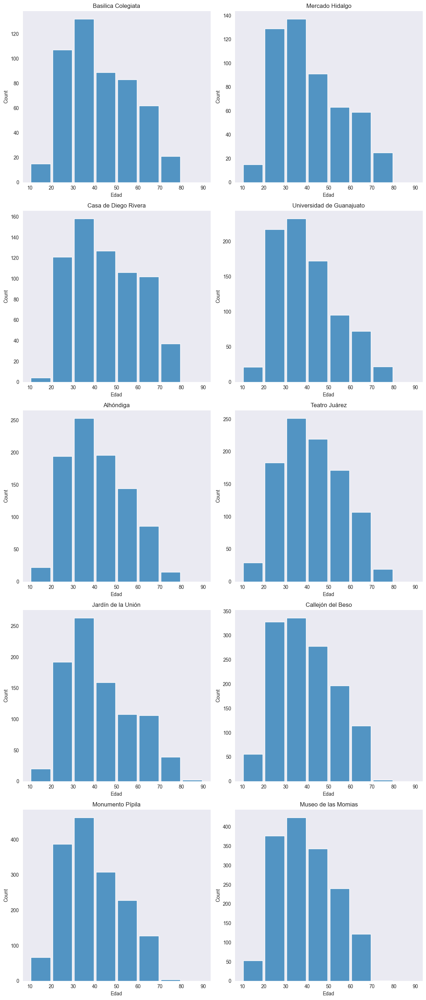

In [14]:
fig, axs = plt.subplots(5, 2, figsize=(12, 28))
for i, place in enumerate(all_dfs):
    sns.histplot(
        all_dfs[place],
        x="Edad",
        shrink=0.9,
        ax=axs[i // 2, i % 2],
        bins=[10, 20, 30, 40, 50, 60, 70, 80, 90],
    )
    axs[i // 2, i % 2].set_title(place)

fig.tight_layout()

### 1.d) Histograma de tipo de visitantes (nacional o internacional) por lugar

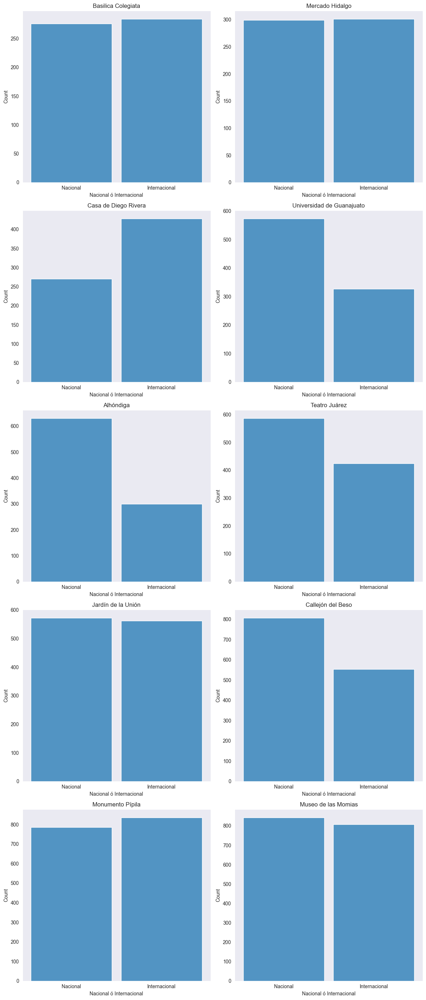

In [15]:
fig, axs = plt.subplots(5, 2, figsize=(12, 28))
for i, place in enumerate(all_dfs):
    sns.histplot(
        all_dfs[place],
        x="Nacional ó Internacional",
        shrink=0.9,
        ax=axs[i // 2, i % 2],
    )
    axs[i // 2, i % 2].set_title(place)

fig.tight_layout()

### 1.e) Histograma de calificaciones ("Excelente", "Muy bueno", "Regular", "Malo", "Pésimo") entre turistas nacionales e internacionales.

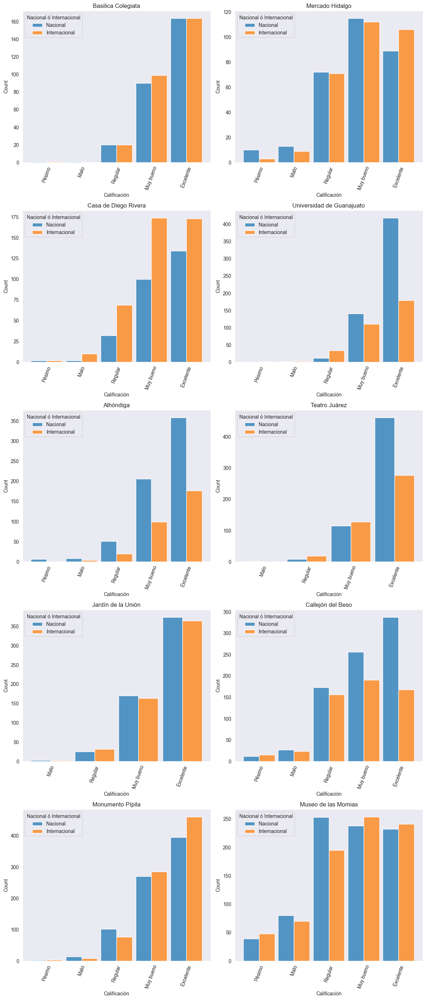

In [16]:
fig, axs = plt.subplots(5, 2, figsize=(12, 28))
for i, place in enumerate(all_dfs):
    sns.histplot(
        all_dfs[place],
        x="Calificación",
        hue="Nacional ó Internacional",
        shrink=0.9, 
        multiple="dodge",
        ax=axs[i // 2, i % 2],
    )
    sns.move_legend(axs[i // 2, i % 2], "upper left")
    axs[i // 2, i % 2].set_title(place)
    axs[i // 2, i % 2].tick_params(axis='x', rotation=70)
    
fig.tight_layout()

### 1.e) Histograma de idiomas de las opiniones en todo el dataset.

Esta gráfica es interesante porque más adelante vamos a quitar las *stopwords* de los idiomas más dominantes en el dataset, el cual podemos intuir son el español y el inglés. La siguiente celda muestra los 10 idiomas más frecuentes en el dataset y el número de opiniones en cada uno. Podemos ver que el tercer idioma más frecuente tiene sólo 224 opiniones, un orden de magnitud menos que el número de opiniones del español e inglés. Por lo que no impacta mucho si las opiniones en otros idiomas distintos al inglés y español se dejan con las stopwords.

[('Español', 6526), ('Inglés', 3069), ('Portugués', 224), ('Japonés', 210), ('Francés', 115), ('Italiano', 68), ('Chino', 52), ('Alemán', 52), ('Coreano', 38), ('Ruso', 36)]


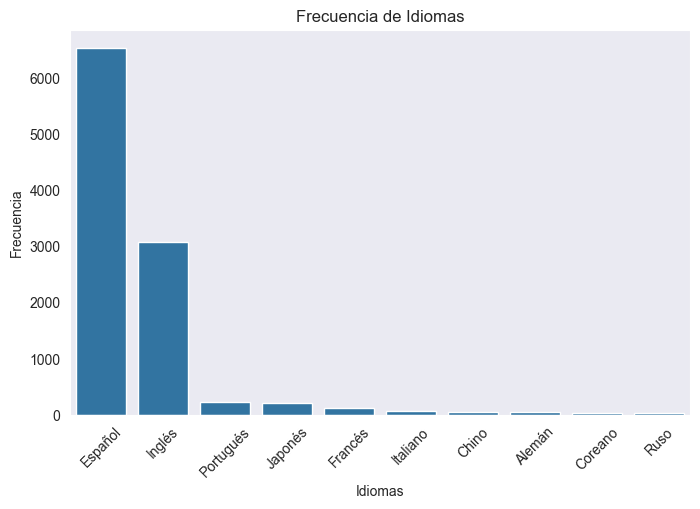

In [17]:
lang_counter = Counter()
for place in all_places:
    lang_counter += Counter(all_dfs[place]["Idioma"].value_counts().to_dict())
    
most_common_lang = lang_counter.most_common(10)

print(most_common_lang)

plt.figure(figsize=(8, 5))
sns.barplot(x=[lang for lang, _ in most_common_lang], y=[freq for _, freq in most_common_lang])

plt.xticks(rotation=45)
plt.xlabel("Idiomas")
plt.ylabel("Frecuencia")
plt.title("Frecuencia de Idiomas")
plt.show()

## 2- Nubes de palabras más relevantes

Además de quitar stopwords, también quitaremos algunos signos de puntuación. El tokenizador que usaremos es ``TweetTokenizer``, y para construir una BoW con TF-IDF usaremos ``TfidfVectorizer`` (un vectorizador por cada lugar turístico).

In [18]:
all_stopwords = set(stopwords.words("spanish")) | set(stopwords.words("english"))
punctuation = {
    "¡",
    "!",
    '"',
    "$",
    "%",
    "&",
    "'",
    "(",
    ")",
    "*",
    "+",
    ",",
    "-",
    ".",
    ":",
    ";",
    "¿",
    "?",
    "@",
    "[",
    "]",
    "_",
    "`",
    "{",
    "}",
    "«",
    "»",
    "…",
}

ignored_tokens = all_stopwords | punctuation

tokenizer = TweetTokenizer(preserve_case=False, reduce_len=True)
corpus = {place: all_dfs[place]["Opinión"].tolist() for place in all_dfs}

def custom_tokenizer(text):
    return [
        tkn for tkn in tokenizer.tokenize(text) if tkn not in ignored_tokens
    ]

In [19]:
vectorizer_per_place = {
    place: TfidfVectorizer(
        tokenizer=custom_tokenizer,
        lowercase=True,
        norm="l2"
    )
    for place in all_dfs
}


tfidf_matrices = {
    place: vectorizer_per_place[place].fit_transform(corpus[place]) for place in corpus
}

/Users/miguelruiz/Documents/Academic Stuff/NLP/Code/.venv/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


Ejemplo:

In [20]:
place = "Alhóndiga"
tfidf_matrices[place].shape

(930, 5460)

In [21]:
vectorizer_per_place[place].vocabulary_

{'construida': 1085,
 'finales': 2106,
 'siglo': 4602,
 'xviii': 5424,
 'mexico': 3231,
 'virreinal': 5281,
 'función': 2212,
 'almacén': 252,
 'tienda': 4935,
 'comercio': 982,
 'habitantes': 2387,
 'acudían': 160,
 'campo': 748,
 'comprar': 1005,
 'haciendas': 2406,
 'vender': 5216,
 'productos': 4044,
 'parada': 3633,
 'obligatoria': 3475,
 'visita': 5288,
 'ciudad': 900,
 'guanajuato': 2340,
 'lugar': 3063,
 'lleno': 3001,
 'historia': 2492,
 'apto': 394,
 'todas': 4957,
 'edades': 1606,
 'dio': 1497,
 'batallas': 582,
 'mas': 3152,
 'lamentables': 2898,
 'guerra': 2352,
 'independencia': 2698,
 'dentro': 1375,
 'alhondiga': 237,
 'encontraban': 1685,
 'familias': 2050,
 'españolas': 1836,
 'cuales': 1222,
 'murieron': 3358,
 'cruelmente': 1214,
 'manos': 3118,
 'indios': 2708,
 'cargo': 791,
 'hidalgo': 2474,
 'pararse': 3636,
 'frente': 2189,
 'imponente': 2635,
 'monumento': 3306,
 'imaginarse': 2607,
 'ríos': 4433,
 'sangre': 4471,
 'hombres': 2520,
 'niños': 3440,
 'muerte': 3

Construimos los mapeos inversos ``{ word id -> word }`` por cada lugar turístico:

In [22]:
index_to_word = {
    place: {i: word for word, i in vectorizer_per_place[place].vocabulary_.items()}
    for place in all_dfs
}

Escogemos las 50 palabras más relevantes con respecto al score Chi-cuadrada. Para ello, se necesita definir una variable objetivo, es decir, necesitamos decir qué tan importantes son las características con respecto a alguna variable de interés. En nuestro caso, nuestra variable de interés es la calificación que dan las personas al lugar turístico, encontrado en la columna "Escala" del dataset.

In [23]:
labels = {place: all_dfs[place]["Escala"].tolist() for place in all_dfs}

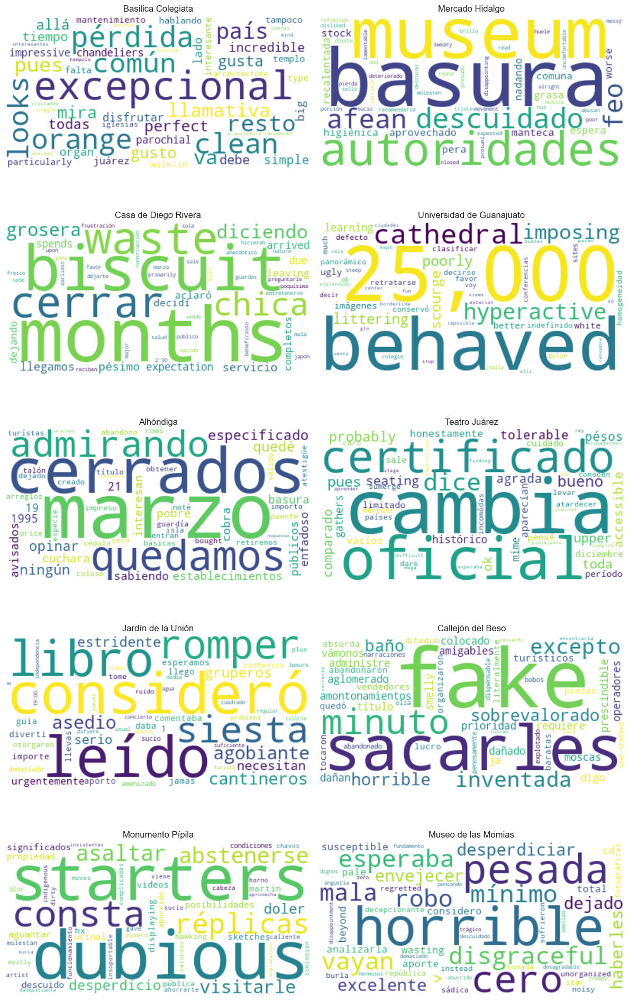

In [24]:
wc = WordCloud(background_color="white")
feat_select = SelectKBest(chi2, k=50)

fig, axs = plt.subplots(5, 2, figsize=(12, 20))

for i, place in enumerate(all_dfs):
    feat_select.fit(tfidf_matrices[place], labels[place])
    best_feats = feat_select.get_support(indices=True)
    word_score = {
        index_to_word[place][idx]: feat_select.scores_[idx] for idx in best_feats
    }
    wc.generate_from_frequencies(word_score)
    axs[i // 2, i % 2].imshow(wc, interpolation="bilinear")
    axs[i // 2, i % 2].axis("off")
    axs[i // 2, i % 2].set_title(place)

fig.tight_layout()

Es curioso que haya aparecido "25,000" como una palabra importante en la Universidad de Guanajuato. A continuación se muestra la (única) opinión que contiene "25,000". 

In [25]:
filtered_df = all_dfs["Universidad de Guanajuato"][all_dfs["Universidad de Guanajuato"]["Opinión"].apply(lambda txt: txt.find("25,000") > 0)]
print(filtered_df[["Escala", "Calificación", "Título de la opinión"]])
print("-"*100)
print("Opinión:", filtered_df["Opinión"].values[0])

     Escala Calificación           Título de la opinión
553       1       Pésimo  "Ugliest architecture in Gto"
----------------------------------------------------------------------------------------------------
Opinión: "Not much to see but for the ugly white imposing cathedral of learning which is really hyperactive poorly behaved littering "students", the scourge of Gto.,25,000 of them."


## 3- Descubrimiento de tópicos con LSA

Para este punto se utilizó la librería ``Gensim``. La siguiente función automatiza el procedimiento de encontrar los tres tópicos más importantes con las 10 palabras más representativas de cada tópico, en cada lugar turístico. Imprime las palabras de cada tópico junto con la "magnitud de asociación". Recordemos que tópico es un vector del tamaño del vocabulario en la que cada entrada contiene la magnitud de asociación del término correspondiente al tópico, y se escogen los 10 términos con mayor valor absoluto. Además, con estas magnitudes se contruyen 3 nubes de palabras, una por cada tópico con las 10 palabras que lo representan, por cada lugar turístico.

La función sólo recibe una función que recibe el dataframe de un lugar turístico y devuelve otro dataframe filtrado, por ejemplo filtrado por opiniones dadas por mujeres u hombres.

In [26]:
def get_top_topics_per_subset(
    df_filtration_func: Callable[[pd.DataFrame], pd.DataFrame],
):
    # df_filtration_fucn is a function that takes a dataframe and returns a filtered dataframe of interest

    wc = WordCloud(background_color="white")

    fig, axs = plt.subplots(10, 3, figsize=(15, 30))

    for i, place in enumerate(all_places):

        tfidf_submatrix = tfidf_matrices[place][
            df_filtration_func(all_dfs[place]).index
        ]  # filtered tf-idf matrix

        lsa = LsiModel(
            tfidf_submatrix.T,
            num_topics=3,
            id2word=index_to_word[place],
        )

        # topics formatted as string
        topics = lsa.print_topics(num_words=10)

        print(f"Tópicos para {place}:")
        for topic_id, topic_str in topics:
            print(f"Tópico {topic_id+1}: {topic_str}")

        # topics as list of tuples (word, weight)
        topics = lsa.show_topics(num_words=10, formatted=False)

        for topic_id, topic_words in topics:

            wc.generate_from_frequencies(
                {word: abs(weight) for word, weight in topic_words}
            )

            axs[i, topic_id].imshow(wc, interpolation="bilinear")
            axs[i, topic_id].axis("off")
            axs[i, topic_id].set_title(f"{place} - Tópico {topic_id+1}")

        print("-" * 100)

    fig.tight_layout()

### 3.a) Hombres

Tópicos para Basilica Colegiata:
Tópico 1: 0.297*"guanajuato" + 0.277*"ciudad" + 0.208*"centro" + 0.199*"iglesia" + 0.196*"noche" + 0.184*"lugar" + 0.170*"basílica" + 0.163*"hermosa" + 0.158*"visitar" + 0.147*"bonita"
Tópico 2: 0.294*"beautiful" + 0.264*"church" + 0.213*"inside" + 0.212*"city" + 0.212*"one" + 0.194*"basilica" + 0.148*"great" + 0.147*"town" + 0.147*"see" + 0.134*"visit"
Tópico 3: 0.284*"guanajuato" + -0.283*"noche" + -0.258*"bonita" + 0.195*"lugar" + -0.195*"dentro" + 0.182*"visita" + -0.167*"hermosa" + 0.166*"pena" + -0.165*"iluminada" + 0.157*"vale"
----------------------------------------------------------------------------------------------------
Tópicos para Mercado Hidalgo:
Tópico 1: 0.338*"mercado" + 0.256*"comida" + 0.212*"lugar" + 0.158*"artesanías" + 0.154*"comprar" + 0.142*"guanajuato" + 0.131*"comer" + 0.129*"si" + 0.126*"recuerdos" + 0.120*"market"
Tópico 2: -0.332*"market" + -0.238*"food" + -0.208*"place" + -0.136*"stalls" + -0.126*"mexican" + -0.118*"buil

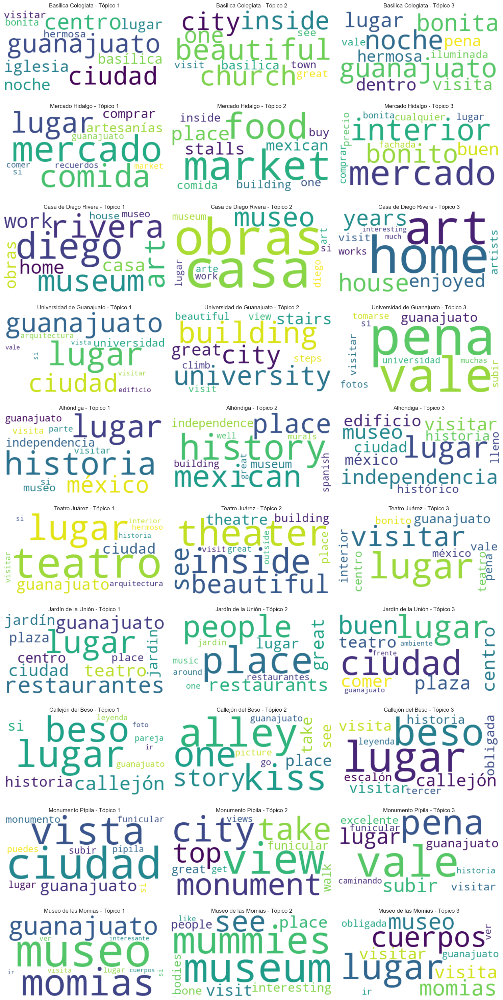

In [27]:
get_top_topics_per_subset(
    lambda df: df[df["Género"] == "Masculino"]
)

### 3.b) Mujeres

Tópicos para Basilica Colegiata:
Tópico 1: 0.263*"hermosa" + 0.246*"ciudad" + 0.237*"guanajuato" + 0.232*"iglesia" + 0.207*"basílica" + 0.178*"bonita" + 0.178*"dentro" + 0.173*"centro" + 0.173*"arquitectura" + 0.167*"noche"
Tópico 2: 0.399*"beautiful" + 0.259*"inside" + 0.222*"see" + 0.208*"basilica" + 0.196*"church" + 0.173*"guanajuato" + 0.152*"amazing" + 0.149*"visit" + 0.143*"city" + 0.142*"night"
Tópico 3: 0.416*"lugar" + -0.326*"bonita" + -0.322*"dentro" + -0.207*"bien" + 0.198*"hermoso" + -0.195*"conservada" + 0.182*"historia" + -0.115*"pena" + 0.113*"noche" + 0.110*"guanajuato"
----------------------------------------------------------------------------------------------------
Tópicos para Mercado Hidalgo:
Tópico 1: 0.316*"mercado" + 0.247*"lugar" + 0.231*"comida" + 0.207*"si" + 0.177*"dulces" + 0.170*"comprar" + 0.168*"artesanías" + 0.164*"comer" + 0.143*"buen" + 0.132*"precios"
Tópico 2: 0.352*"market" + 0.339*"food" + 0.187*"great" + 0.163*"buy" + 0.150*"souvenirs" + 0.135*"

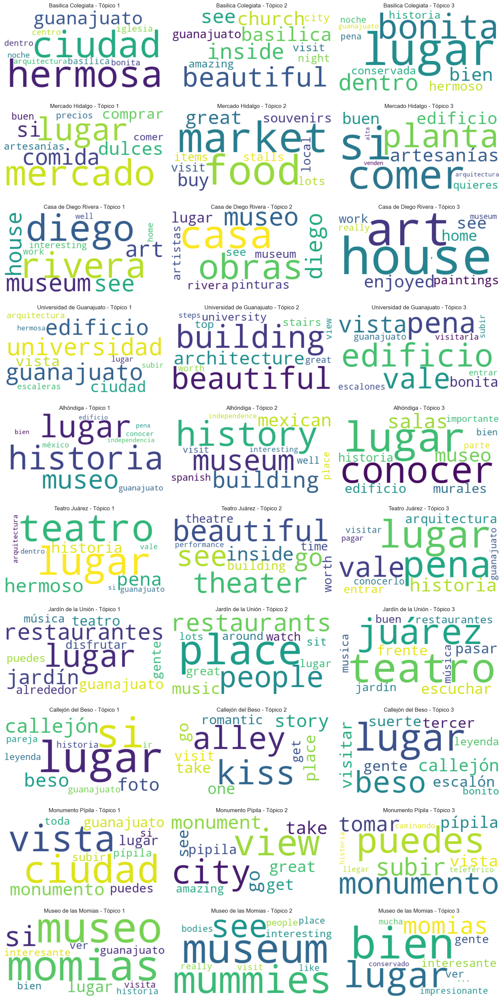

In [28]:
get_top_topics_per_subset(
    lambda df: df[df["Género"] == "Femenino"]
)

### 3.c) Turistas Nacionales

Tópicos para Basilica Colegiata:
Tópico 1: 0.253*"guanajuato" + 0.249*"ciudad" + 0.234*"hermosa" + 0.221*"lugar" + 0.221*"bonita" + 0.206*"basílica" + 0.191*"arquitectura" + 0.184*"centro" + 0.176*"iglesia" + 0.175*"si"
Tópico 2: 0.459*"bonita" + -0.423*"lugar" + 0.284*"dentro" + -0.209*"hermoso" + -0.180*"guanajuato" + 0.160*"vale" + 0.160*"pena" + -0.128*"arquitectura" + -0.126*"conocer" + -0.111*"historia"
Tópico 3: -0.426*"hermosa" + 0.283*"lugar" + 0.220*"bonita" + -0.211*"ciudad" + 0.160*"guanajuato" + 0.157*"hermoso" + -0.153*"centro" + -0.153*"noche" + -0.148*"arquitectura" + 0.133*"si"
----------------------------------------------------------------------------------------------------
Tópicos para Mercado Hidalgo:
Tópico 1: 0.314*"mercado" + 0.287*"comida" + 0.232*"lugar" + 0.204*"si" + 0.201*"artesanías" + 0.185*"dulces" + 0.168*"comprar" + 0.154*"precios" + 0.149*"comer" + 0.130*"guanajuato"
Tópico 2: 0.407*"si" + 0.302*"comer" + -0.259*"artesanías" + -0.203*"planta" + -0.15

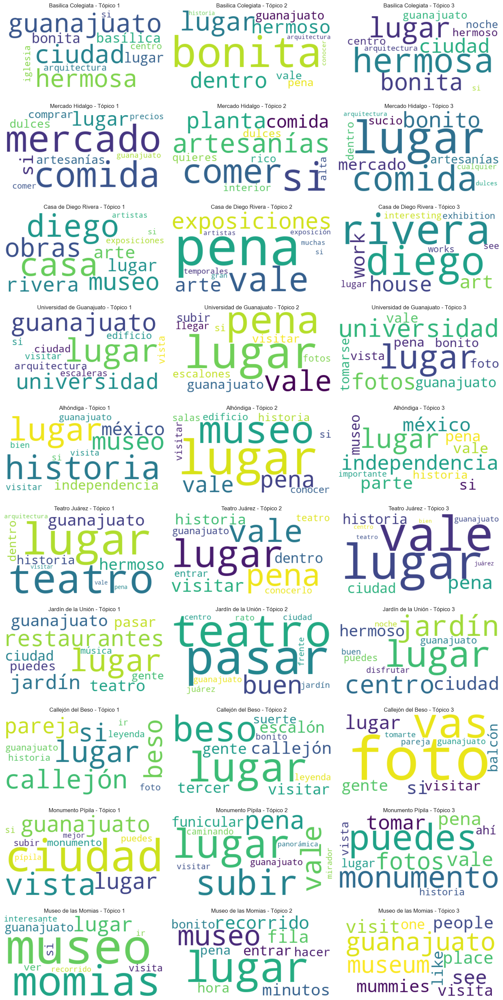

In [29]:
get_top_topics_per_subset(
    lambda df: df[df["Nacional ó Internacional"] == "Nacional"]
)

### 3.d) Turistas Internacionales

Tópicos para Basilica Colegiata:
Tópico 1: 0.345*"beautiful" + 0.264*"inside" + 0.247*"church" + 0.245*"basilica" + 0.215*"guanajuato" + 0.198*"one" + 0.198*"city" + 0.178*"see" + 0.128*"visit" + 0.128*"around"
Tópico 2: -0.302*"iglesia" + -0.299*"ciudad" + -0.217*"noche" + -0.198*"centro" + -0.170*"hermosa" + -0.164*"amarillo" + -0.156*"día" + -0.155*"plaza" + -0.154*"basílica" + -0.152*"guanajuato"
Tópico 3: 0.393*"one" + -0.340*"church" + 0.293*"basilica" + -0.224*"inside" + 0.153*"many" + 0.148*"see" + 0.146*"guanajuato" + -0.135*"walk" + -0.105*"center" + -0.105*"walked"
----------------------------------------------------------------------------------------------------
Tópicos para Mercado Hidalgo:
Tópico 1: 0.389*"market" + 0.312*"food" + 0.158*"stalls" + 0.155*"place" + 0.137*"great" + 0.136*"buy" + 0.132*"souvenirs" + 0.129*"visit" + 0.125*"building" + 0.123*"like"
Tópico 2: -0.348*"mercado" + -0.229*"lugar" + -0.174*"recuerdos" + -0.172*"comprar" + -0.170*"comida" + -0.150*"c

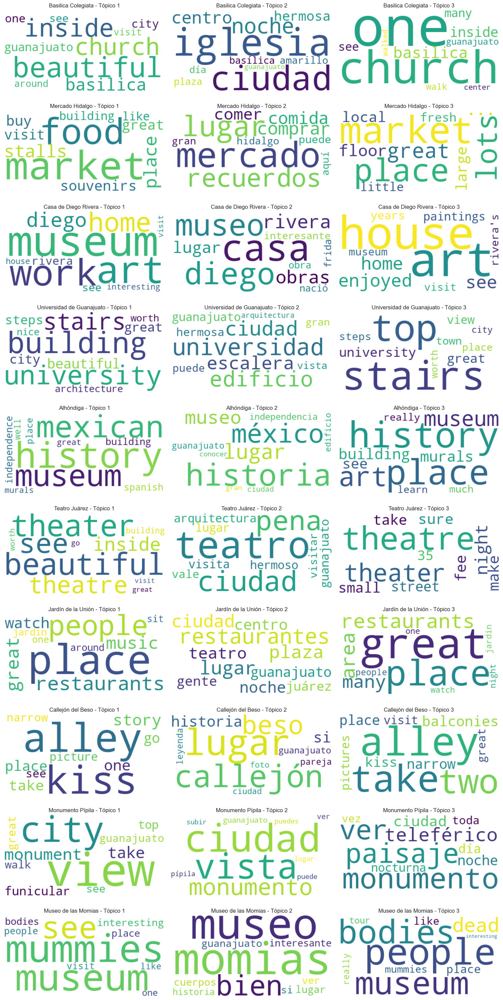

In [30]:
get_top_topics_per_subset(
    lambda df: df[df["Nacional ó Internacional"] == "Internacional"]
)

### 3.e) Jóvenes de hasta 30 años

Tópicos para Basilica Colegiata:
Tópico 1: -0.262*"guanajuato" + -0.258*"ciudad" + -0.229*"dentro" + -0.209*"basílica" + -0.199*"iglesia" + -0.197*"lugar" + -0.194*"bonita" + -0.191*"noche" + -0.141*"arquitectura" + -0.138*"hermosa"
Tópico 2: -0.371*"beautiful" + -0.224*"basilica" + -0.208*"church" + -0.182*"great" + -0.163*"city" + -0.163*"visit" + -0.154*"guanajuato" + -0.148*"churches" + -0.142*"inside" + -0.140*"well"
Tópico 3: -0.375*"lugar" + 0.337*"bonita" + 0.333*"dentro" + -0.193*"hermoso" + -0.150*"historia" + 0.142*"..." + -0.136*"templo" + 0.127*"caminando" + 0.122*"bella" + -0.110*"admirar"
----------------------------------------------------------------------------------------------------
Tópicos para Mercado Hidalgo:
Tópico 1: -0.309*"mercado" + -0.266*"comida" + -0.265*"si" + -0.238*"lugar" + -0.190*"comer" + -0.182*"artesanías" + -0.177*"comprar" + -0.147*"dulces" + -0.121*"variedad" + -0.119*"precios"
Tópico 2: -0.392*"food" + -0.277*"market" + -0.183*"place" + -0.167

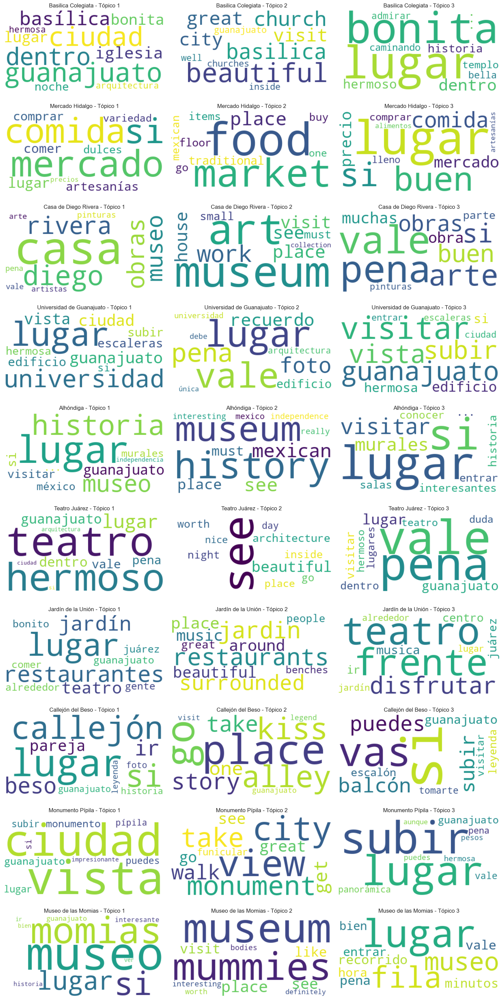

In [31]:
get_top_topics_per_subset(
    lambda df: df[df["Edad"] <= 30]
)

### 3.f) Mayores por lo menos 60 años

Tópicos para Basilica Colegiata:
Tópico 1: 0.331*"beautiful" + 0.285*"one" + 0.235*"basilica" + 0.231*"see" + 0.212*"inside" + 0.167*"many" + 0.162*"guanajuato" + 0.160*"city" + 0.157*"church" + 0.149*"visit"
Tópico 2: -0.255*"ciudad" + -0.210*"centro" + -0.201*"día" + -0.193*"iglesia" + -0.189*"lugar" + -0.183*"hermosa" + -0.182*"noche" + -0.173*"basílica" + -0.160*"guanajuato" + -0.155*"interior"
Tópico 3: 0.429*"one" + 0.275*"many" + -0.234*"inside" + -0.184*"outside" + -0.172*"interesting" + -0.158*"around" + 0.141*"see" + -0.134*"time" + -0.132*"area" + -0.128*"well"
----------------------------------------------------------------------------------------------------
Tópicos para Mercado Hidalgo:
Tópico 1: 0.292*"market" + 0.229*"food" + 0.176*"everything" + 0.144*"stalls" + 0.143*"find" + 0.142*"..." + 0.141*"mercado" + 0.134*"buy" + 0.133*"place" + 0.133*"mexican"
Tópico 2: 0.367*"mercado" + 0.199*"aquí" + 0.151*"ciudad" + 0.133*"gran" + 0.121*"recuerdos" + 0.118*"méxico" + 0.117

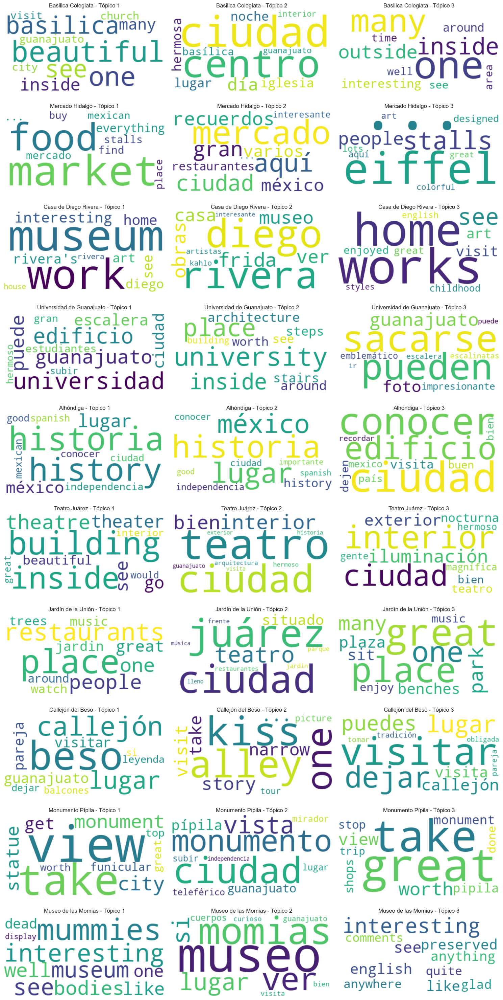

In [32]:
get_top_topics_per_subset(
    lambda df: df[df["Edad"] >= 60]
)

## 4- Nubes de unigramas/bigramas/trigramas más relevantes

Consideremos una bolsa de palabras $C$ con pesos TF-IDF, en la que las columnas pueden ser unigramas, bigramas o algún otro tipo de token. Notemos que el TF-IDF del token $j$ *con respecto al corpus* es la suma los TF-IDF sobre todos los documentos, es decir, $\sum_{i} C[i,j]$. De tal manera que esta suma es considerada para ver cuáles son los tokens con mayor TF-IDF.

Conforme se van calculando las BoW de unigramas, bigramas y trigramas se van concatenando.

In [33]:
bow_per_place = { place: None for place in all_places }
tknid2tkn_per_place = { place: None for place in all_places }

### 4.i) BoW de términos (unigramas)

In [34]:
n_unigrams = 1000

for place in all_places:
    # sum of tf-idf weights per token and convert to 1D numpy-array
    tfidf_per_token = np.asarray(tfidf_matrices[place].sum(axis=0))[0]

    words_tfidf = [(tkn_id, weight) for tkn_id, weight in enumerate(tfidf_per_token)]
    words_tfidf.sort(key=lambda x: x[1], reverse=True)

    top_tokens = [tkn_id for tkn_id, _ in words_tfidf[:n_unigrams]]

    bow_per_place[place] = tfidf_matrices[place][:, top_tokens]

    # create new mapping of token ids to words according to the filtering
    tknid2tkn_per_place[place] = {
        tkn_id_new: index_to_word[place][tkn_id_old]
        for tkn_id_new, tkn_id_old in enumerate(top_tokens)
    }

Matrices obtenidas hasta el momento:

In [35]:
bow_per_place[all_places[0]]

<560x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 7406 stored elements in Compressed Sparse Row format>

### 4.ii) Bow de bigramas

In [36]:
n_bigrams = 2000

for place in all_places:
    vectorizer = TfidfVectorizer(
        tokenizer=custom_tokenizer,
        lowercase=True,
        norm="l2",
        ngram_range=(2, 2),
    )

    tfidf_bigrams = vectorizer.fit_transform(corpus[place])
    id_2_tkn = {tkn_id: tkn for tkn, tkn_id in vectorizer.vocabulary_.items()}

    # sum of tf-idf weights per token and convert to 1D numpy-array
    tfidf_per_tkn = np.asarray(tfidf_bigrams.sum(axis=0))[0]

    tkns_tfidf = [(tkn_id, weight) for tkn_id, weight in enumerate(tfidf_per_tkn)]
    tkns_tfidf.sort(key=lambda x: x[1], reverse=True)

    top_tokens = [tkn_id for tkn_id, _ in tkns_tfidf[:n_bigrams]]

    # update global mapping { new token id -> token }
    tknid2tkn_per_place[place].update(
        {
            i + bow_per_place[place].shape[1]: id_2_tkn[tkn_id]
            for i, tkn_id in enumerate(top_tokens)
        }
    )

    bow_per_place[place] = hstack(
        [bow_per_place[place], tfidf_bigrams[:, top_tokens]]
    )  # concatenate sparse matrices horizontally

/Users/miguelruiz/Documents/Academic Stuff/NLP/Code/.venv/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


Matrices concatenadas obtenidas hasta el momento:

In [37]:
bow_per_place[all_places[0]]

<560x3000 sparse matrix of type '<class 'numpy.float64'>'
	with 10494 stored elements in Compressed Sparse Row format>

### 4.iii) BoW de trigramas

In [38]:
n_trigrams = 1000

for place in all_places:
    vectorizer = TfidfVectorizer(
            tokenizer=custom_tokenizer,
            lowercase=True,
            norm="l2",
            ngram_range=(3, 3),
        )
    
    tfidf_trigrams = vectorizer.fit_transform(corpus[place])
    id_2_tkn = {tkn_id: tkn for tkn, tkn_id in vectorizer.vocabulary_.items()}
    
    tfidf_per_tkn = np.asarray(tfidf_trigrams.sum(axis=0))[0] # sum of tf-idf weights per token and convert to 1D numpy-array 
    
    tkns_tfidf = [(tkn_id, weight) for tkn_id, weight in enumerate(tfidf_per_tkn)]
    tkns_tfidf.sort(key=lambda x: x[1], reverse=True)

    top_tokens = [token_id for token_id, _ in tkns_tfidf[:n_trigrams]]
    
    # update global mapping { new token id -> token }
    tknid2tkn_per_place[place].update(
        {
            i + bow_per_place[place].shape[1]: id_2_tkn[tkn_id]
            for i, tkn_id in enumerate(top_tokens)
        }
    )

    bow_per_place[place] = hstack([bow_per_place[place], tfidf_trigrams[:, top_tokens]])  # concatenate sparse matrices horizontally

Matrices concatenadas obtenidas hasta el momento (con un total de 4000 columnas como esperamos):

In [39]:
bow_per_place[all_places[0]]

<560x4000 sparse matrix of type '<class 'numpy.float64'>'
	with 11615 stored elements in Compressed Sparse Row format>

### Nube

Después de escoger las 1000 features más relevantes con Chi-cuadrada, sólo nos quedamos con el top 50 para la nube de palabras.

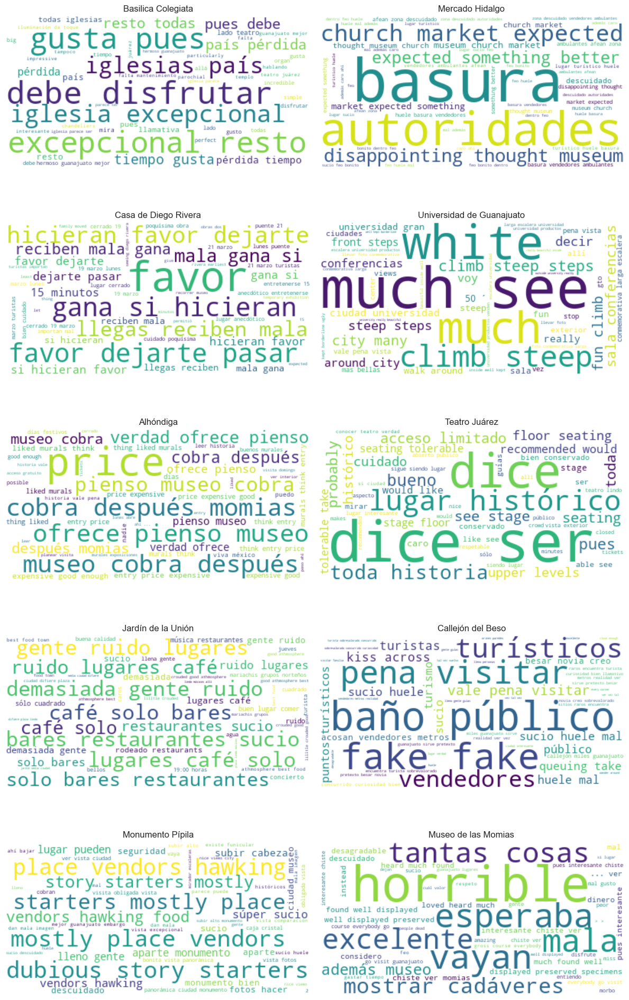

In [40]:
wc = WordCloud(background_color="white")
feat_select = SelectKBest(chi2, k=1000)

fig, axs = plt.subplots(5, 2, figsize=(12, 20))

for i, place in enumerate(all_dfs):
    feat_select.fit(bow_per_place[place], labels[place])
    best_feats = feat_select.get_support(indices=True)  # best 1000 features
    best_feats_score = [(idx, feat_select.scores_[idx]) for idx in best_feats]
    best_feats_score.sort(key=lambda x: x[1], reverse=True)

    wc.generate_from_frequencies(
        {
            tknid2tkn_per_place[place][idx]: score
            for idx, score in best_feats_score[:50]  # top 50 features for word cloud
        }
    )

    axs[i // 2, i % 2].imshow(wc, interpolation="bilinear")
    axs[i // 2, i % 2].axis("off")
    axs[i // 2, i % 2].set_title(place)

fig.tight_layout()

## 5- Análisis temporal de opiniones

Vamos a visualizar la proporción de opiniones positivas, negativas y neutras en una ventana de tiempo deslizante de 1 año, avanzando la ventana en cuartos de año. Estas proporciones puede ser interpretadas como las probabilidades de que una reseña sea positiva, negativa o neutra en el último año. Primero hacemos el mapeo del score a tipo de opinión, y luego mostramos las gráficas temporales por lugar turístico. Mediante inspección, se observó que antes del 2012 las gráficas tenían un comportamiento errático debido a la falta de opiniones antes de ese año. Después ya se observa un comportamiento suavizado.

In [41]:
for place in all_places:
    all_dfs[place]["pos/neg"] = all_dfs[place]["Escala"].apply(lambda score: "Positivo" if score > 3 else ("Negativo" if score < 3 else "Neutro"))

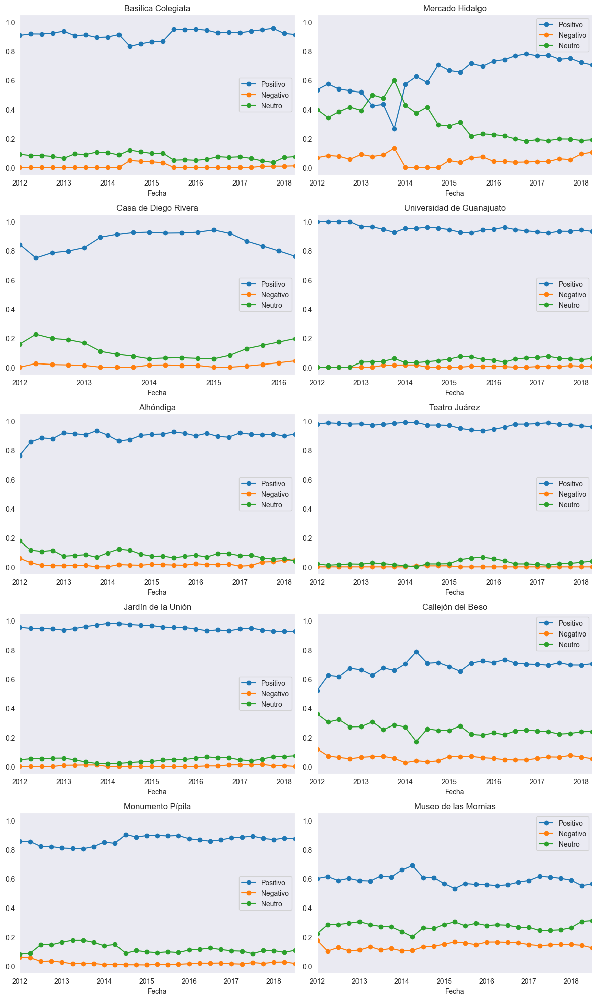

In [42]:
fig, axs = plt.subplots(5, 2, figsize=(12, 20))

for i, place in enumerate(all_places):
    df = (
        all_dfs[place].sort_values("Fecha").reset_index(drop=True)[["Fecha", "pos/neg"]]
    )

    category_dummies = pd.get_dummies(
        df["pos/neg"]
    )  # one-hot encoding: "Positivo", "Negativo", "Neutro" columns
    category_dummies["Fecha"] = df["Fecha"]
    grouped = category_dummies.groupby("Fecha")[
        ["Positivo", "Negativo", "Neutro"]
    ].sum()
    grouped_quarters = grouped.resample("QE").sum()  # consider data by quarters

    rolling_window = grouped_quarters.rolling(window=4, min_periods=1).sum()
    rolling_proportions = rolling_window.div(
        rolling_window.sum(axis=1), axis=0
    )  # divide by the sum of each row to get proportions

    rolling_proportions.loc[pd.to_datetime("2012-01-01") :].plot(
        ax=axs[i // 2, i % 2],
        marker="o"
    )  # plot after 2012 when there is more data

    axs[i // 2, i % 2].set_title(place)
    axs[i // 2, i % 2].set_ylim(-0.05, 1.05)

fig.tight_layout()

## 6- Preguntas

### 6.1) ¿De los sitios turísticos, cuál diría usted que es el más polémico y la razón de ello?

Yo diría que el Museo de las Momias es el más polémico. A lo largo del tiempo se observa cómo la probabilidad de que una reseña sea positiva se mantiene alrededor del 60%. Esto indica que de manera persistente en el tiempo, el 40% de las veces se realizan reseñas neutras (poco más del 20%) y negativas (poco menos del 20%). 

Además, en la nube de palabras y de los $n$-gramas más relevantes se observa que al Museo de las Momias se le asocian términos con connotación negativa tales como "mala", "horrible", "pesada", "disgraceful", "robo", "desagradable", "angustia", "decepcionante", "wasting", "unorganized", "descuidado".

Esto sugiere que la administración del museo no ha atendido las quejas de sus visitantes durante muchos años, al menos entre el 2012 y 2018. Habría que ver si entre 2018 y 2025 han trabajado en algo para mejorar la experiencia del público.

También cabe resaltar que sí hay personas que encuentran interesante el museo de las momias. De hecho, "interesante" es una de las palabras que se ven en los 3 tópicos más importantes de las opiniones, como se observa en las nubes de palabras en cada tópico y en cada grupo de personas del ejercicio 3.

### 6.2) En cuanto al sitio más polémico, ¿cómo es la diferencia de opinión y temas entre turistas nacionales e internacionales?

En el histograma de calificaciones entre turistas nacionales e internacionales, se observa un comportamiento similar a el número de calificaciones de cada tipo ("Excelente", "Muy bueno", etc.). Pero la diferencia radica en que a los turistas nacionales le asignan más la calificación de "Regular", mientras que los internacionales le asignan más la calificación "Muy bueno" o "Excelente" (casi en la mismo proporción). Sin embargo, los nacionales también le asignan la calificación de "Muy bueno" y "Excelente" con una proporción ligeramente menor que "Regular". 

Para saber de qué temas hablan los turistas nacionales e internacionales con un poco más de profundidad, pusimos los 5 tópicos más importantes para ellos y 50 palabras por cada tópico en las nubes de palabras de la siguiente celda. Se observa que los turistas nacionales se quejan mucho de las fijas para entrar, ya que "fila" se encuentra en los tópicos 2 a 5. Por otro lado, podemos pensar que los internacionales se quejan menos que los nacionales, pues sólo hasta el tópico 5 se observan palabras como "line", "long", "wait".

Sin embargo, a pesar de tener reseñas negativas y la calificación promedio más baja de los 10 sitios turísticos, la gente piensa que es interesante y que es una visita obligada en Guanajuato. Esto se observa en diferentes nubes de palabras que contienen algunos términos como "interesante", "visitar" y "obligada".

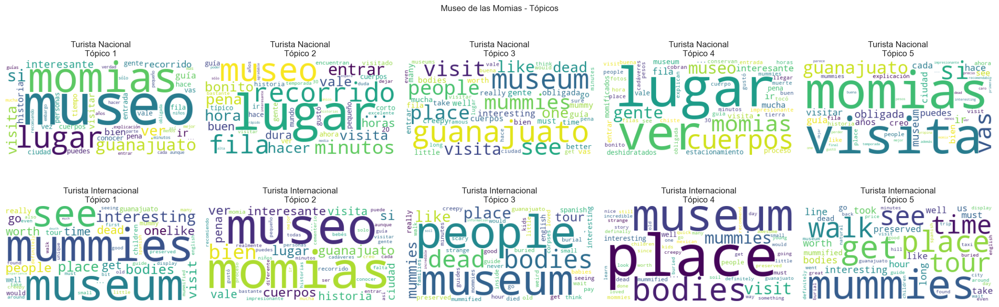

In [43]:
place = "Museo de las Momias"
wc = WordCloud(background_color="white")

fig, axs = plt.subplots(2, 5, figsize=(20, 7))

df = all_dfs[place]

### Turista nacional

tfidf_submatrix = tfidf_matrices[place][
    df[df["Nacional ó Internacional"] == "Nacional"].index
]  # filtered tf-idf matrix

lsa = LsiModel(
    tfidf_submatrix.T,
    num_topics=5,
    id2word=index_to_word[place],
)

# topics as list of tuples (word, weight)
topics = lsa.show_topics(num_words=50, formatted=False)

for topic_id, topic_words in topics:

    wc.generate_from_frequencies(
        {word: abs(weight) for word, weight in topic_words}
    )

    axs[0, topic_id].imshow(wc, interpolation="bilinear")
    axs[0, topic_id].axis("off")
    axs[0, topic_id].set_title(f"Turista Nacional\nTópico {topic_id+1}")
    
### Turista internacional
    
tfidf_submatrix = tfidf_matrices[place][
    df[df["Nacional ó Internacional"] == "Internacional"].index
]  # filtered tf-idf matrix

lsa = LsiModel(
    tfidf_submatrix.T,
    num_topics=5,
    id2word=index_to_word[place],
)

# topics as list of tuples (word, weight)
topics = lsa.show_topics(num_words=50, formatted=False)

for topic_id, topic_words in topics:

    wc.generate_from_frequencies(
        {word: abs(weight) for word, weight in topic_words}
    )

    axs[1, topic_id].imshow(wc, interpolation="bilinear")
    axs[1, topic_id].axis("off")
    axs[1, topic_id].set_title(f"Turista Internacional\nTópico {topic_id+1}")

fig.suptitle("Museo de las Momias - Tópicos")
fig.tight_layout()

### 6.3) ¿Cual diría que es el sitio que le gusta más a las mujeres y por qué?

Para contestar la pregunta, en la siguiente gráfica se observa el score promedio entre las mujeres para cada lugar turístico. Aquí vemos Teatro Juárez es el que más les gusta. En los tres tópicos más importantes de las reseñas de mujeres para este sitio (ver las nubes de puntos), se rescatan los siguientes términos:

1. "arquitectura",
2. "hermoso"/"beautiful", 
3. "vale la pena",
4. "visitar"/"go"

Podemos intuir que las mujeres están recomendando el lugar diciendo que es un lugar que vale la pena visitar por su arquitectura y belleza. De hecho no sólo a las mujeres les gusta, podemos decir que en general es un sitio muy apreciado por los turistas, pues a lo largo del tiempo las reseñas positivas se han mantenido (ver gráfica de análisis temporal)  y con reseñas negativas casi inexistentes (ver histograma de calificaciones por género).

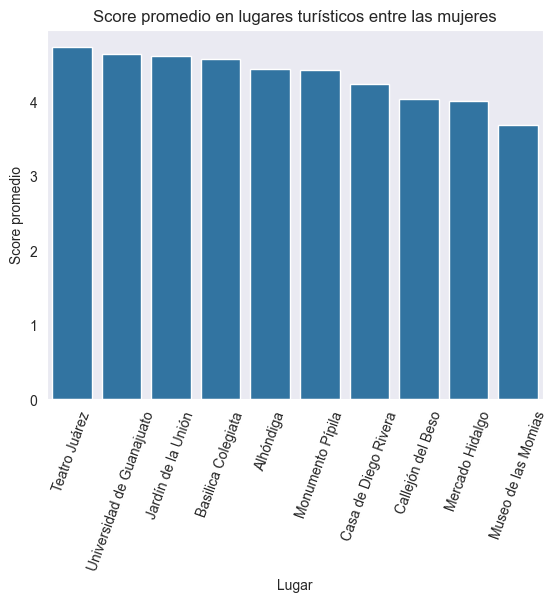

In [44]:
score_per_place = []

for place in all_places:
    df = all_dfs[place]
    df = df[df["Género"] == "Femenino"]
    
    mean = df["Escala"].mean()
    
    score_per_place.append((mean, place))
    
score_per_place.sort(reverse=True)
    
sns.barplot(x=[place for _, place in score_per_place], y=[score for score, _ in score_per_place])
plt.xticks(rotation=70)
plt.xlabel("Lugar")
plt.ylabel("Score promedio")
plt.title("Score promedio en lugares turísticos entre las mujeres")
plt.show()

### 6.4) ¿Cuál diría que es el sitio que le gusta más a las personas jóvenes y por qué?

En la siguiente gráfica se observa el score promedio entre los jóvenes (de hasta 30 años) para cada lugar turístico. Aquí vemos Teatro Juárez es el que más les gusta (como era de esperarse). Al observar los tópicos más importantes de los que hablan los jóvenes acerca del Teatro Juárez, notamos el mismo patrón que con las mujeres: dicen que es un lugar hermoso y resaltan su arquitectura.

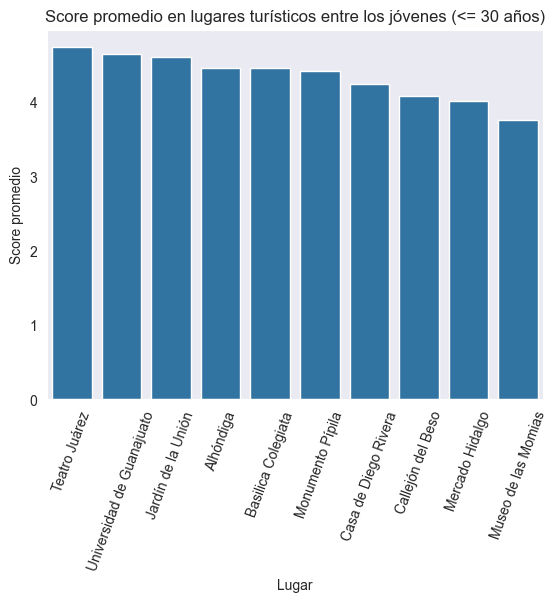

In [ ]:
score_per_place = []

for place in all_places:
    df = all_dfs[place]
    df = df[df["Edad"] <= 30]
    
    mean = df["Escala"].mean()
    
    score_per_place.append((mean, place))
    
score_per_place.sort(reverse=True)
    
sns.barplot(x=[place for _, place in score_per_place], y=[score for score, _ in score_per_place])
plt.xticks(rotation=70)
plt.xlabel("Lugar")
plt.ylabel("Score promedio")
plt.title("Score promedio en lugares turísticos entre los jóvenes (<= 30 años)")
plt.show()

### 6.5) ¿Qué otras observaciones valiosas puede obtener de su análisis? (e.g., ¿identificó de que se queja la gente? ¿qué tipo de cosas le gustó a la gente?, etc.)

Basándonos en el score promedio, nos dimos cuenta que el top 3 (ver gráfica abajo) de los lugares turísticos son: 1) Teatro Juárez, 2) Universidad de Guanajuato, y 3) Jardín de la Unión. En el análisis temporal vimos cómo justamente estos lugares tienen una constancia en la proporción $\approx 1$ de reseñas buenas a lo largo del tiempo. En la nube de $n$-gramas ($n=1,2,3$) y en las nubes de los tópicos más importantes (e.g., para los turistas nacionales e internacionales), observamos qué es lo que les gusta a la gente de estos lugares:
1. Teatro Juárez: un lugar hermoso por su arquitectura y por dentro que vale la pena conocer. 
2. Universidad de Guanajuato: hermoso edificio por su arquitectura, con buena vista al subir las escaleras conmemorativas, y en donde te puedes tomar tu foto de recuerdo.
3. Jardín de la Unión: lugar para ir a restaurantes y bares, con buena comida y buena atmósfera creada por los mariachis y grupos norteños.

Por otro lado, los 3 sitios turísticos de menor score promedio fueron 1) Museo de las Momias, 2) Mercado Hidalgo, y 3) Callejón del Beso. Estos lugares de hecho ya tienen una puntuación promedio menor que 4. De nuevo, en la nube de $n$-gramas y en las nubes de los tópicos más importantes observamos algunas cosas negativas de estos lugares:
1. Museo de las Momias: Algunas personas encuentran al lugar desagradable, descuidado y decepcionante. También surgen términos relacionados con las filas de acceso.
2. Mercado Hidalgo: El lugar se percibe sucio, descuidado y con basura.
3. Callejón del Beso: Las personas dicen que huele mal, está sucio y algunos dicen que está sobrevalorado. También mencionan que suele haber aglomeraciones.

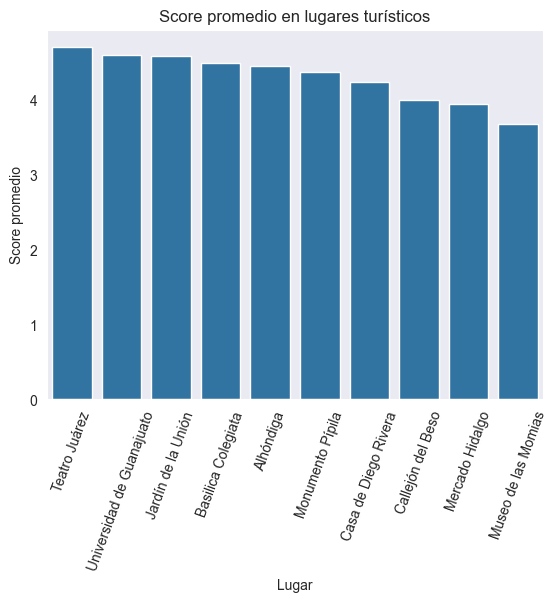

In [46]:
score_per_place = []

for place in all_places:
    df = all_dfs[place]
    
    mean = df["Escala"].mean()
    
    score_per_place.append((mean, place))
    
score_per_place.sort(reverse=True)
    
sns.barplot(x=[place for _, place in score_per_place], y=[score for score, _ in score_per_place])
plt.xticks(rotation=70)
plt.xlabel("Lugar")
plt.ylabel("Score promedio")
plt.title("Score promedio en lugares turísticos")
plt.show()